
############################################################
Processing seq_01
############################################################

=== seq_01 - Frame 000000.png (frame_idx=0) ===


C:\Users\NILMA\AppData\Local\Temp\ipykernel_39352\4086403715.py:315: RuntimeWarning: All-NaN slice encountered
  disp_fused = np.nanmedian(disp_stack_masked, axis=0)


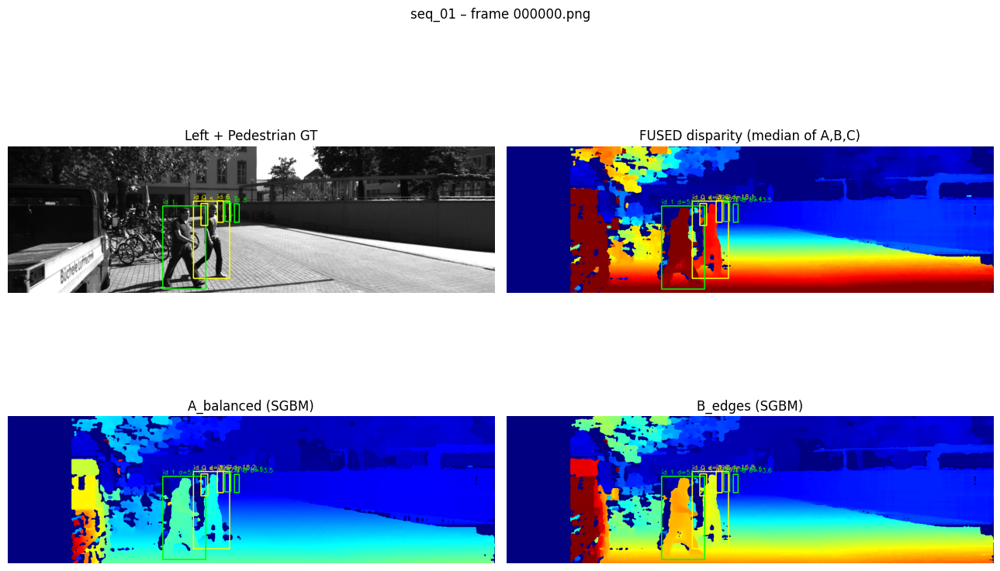


=== seq_01 - Frame 000010.png (frame_idx=10) ===


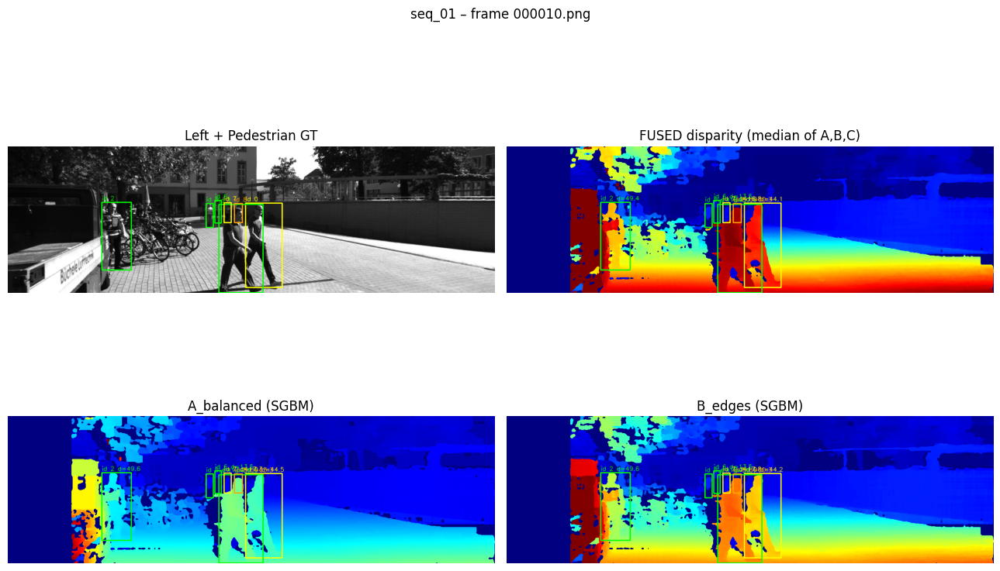


=== seq_01 - Frame 000020.png (frame_idx=20) ===


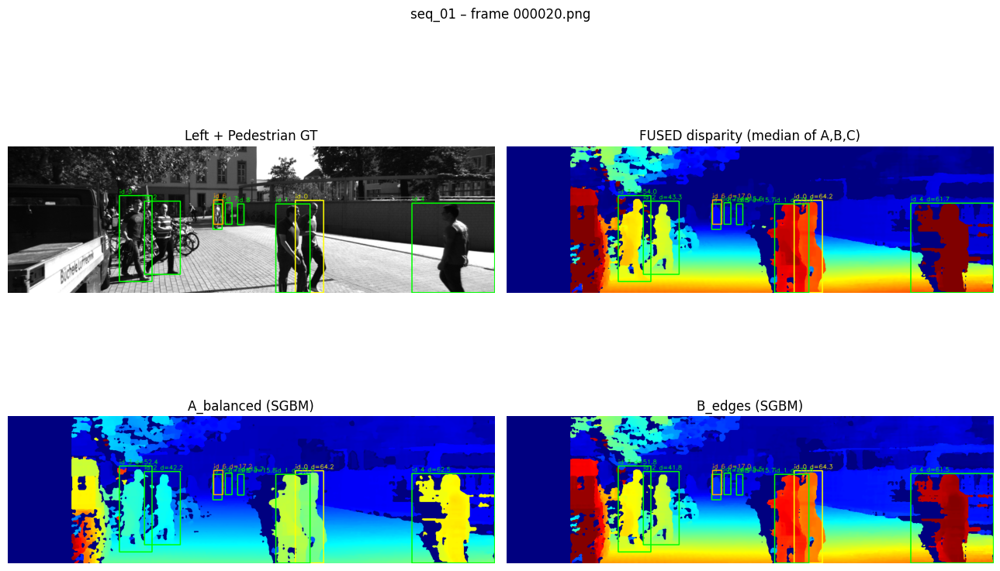


=== seq_01 - Frame 000030.png (frame_idx=30) ===


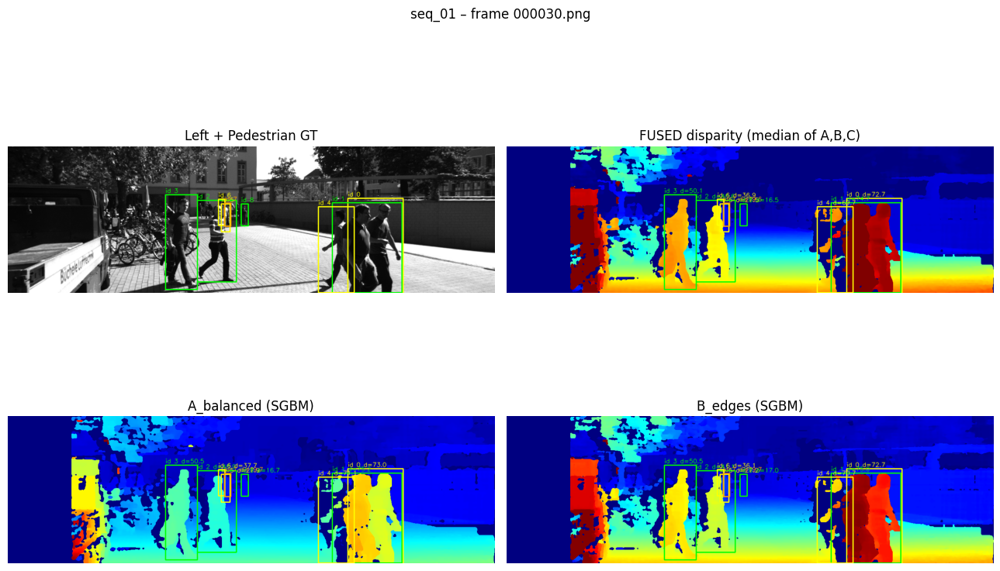


=== seq_01 - Frame 000040.png (frame_idx=40) ===


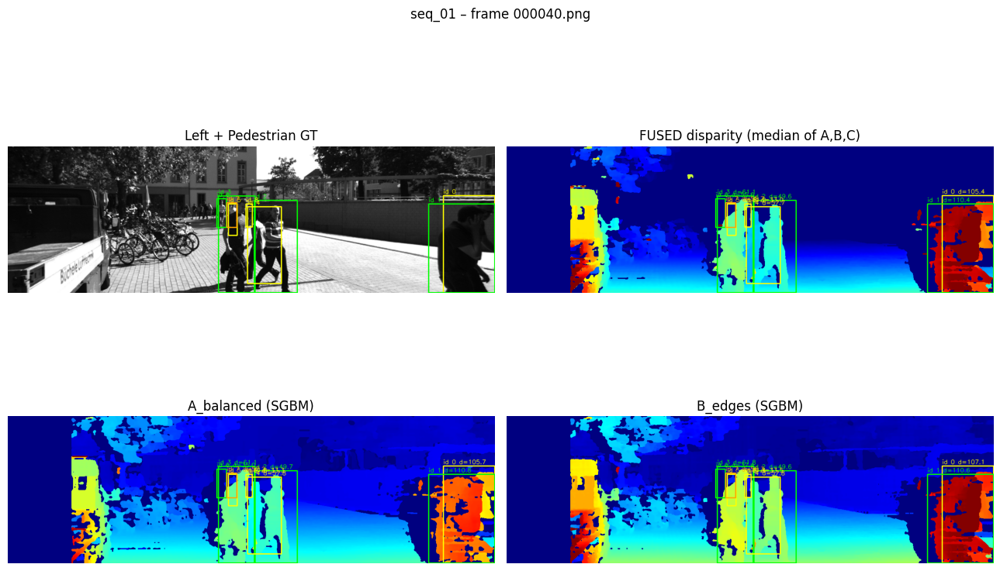


=== seq_01 - Frame 000050.png (frame_idx=50) ===


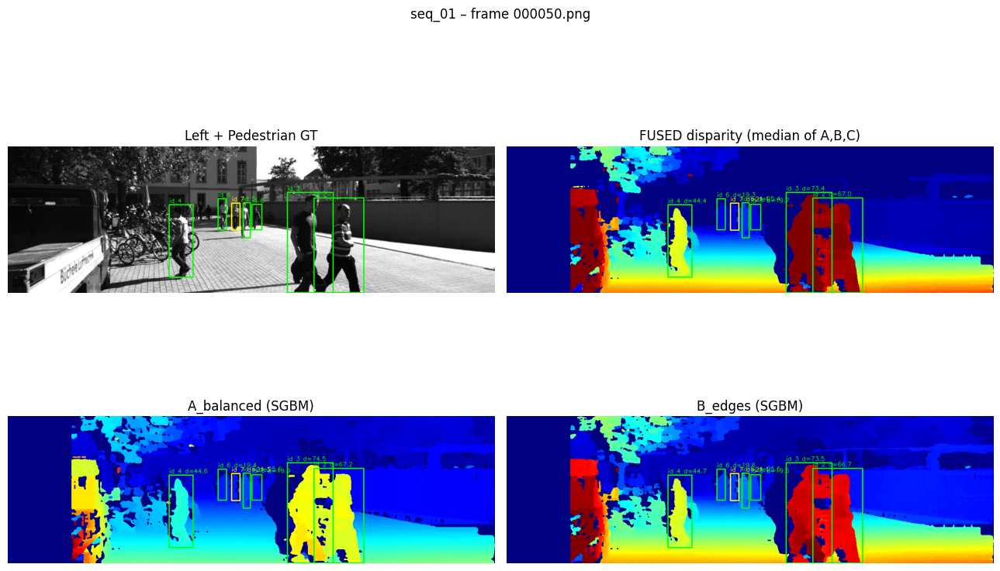


=== seq_01 - Frame 000060.png (frame_idx=60) ===


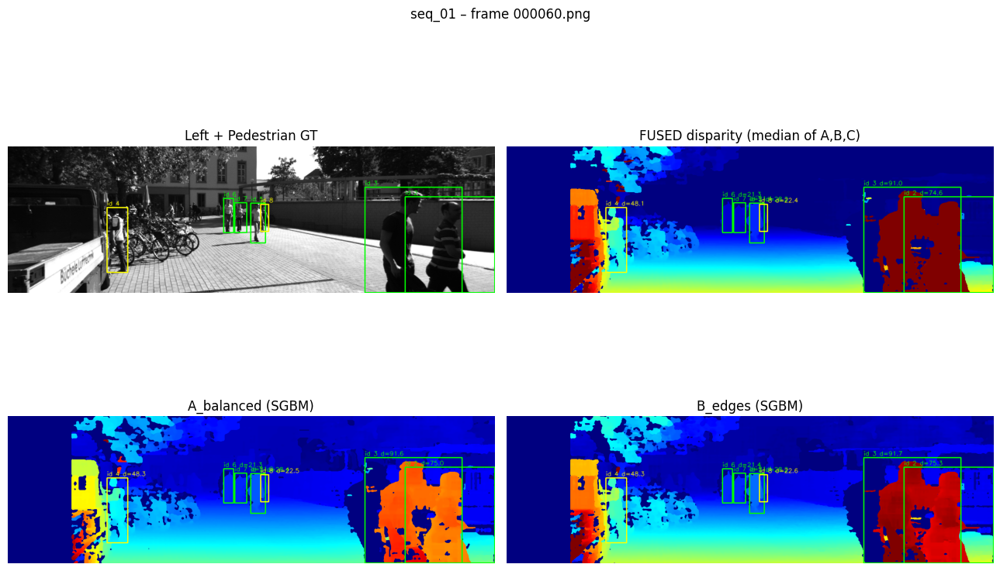


=== seq_01 - Frame 000070.png (frame_idx=70) ===


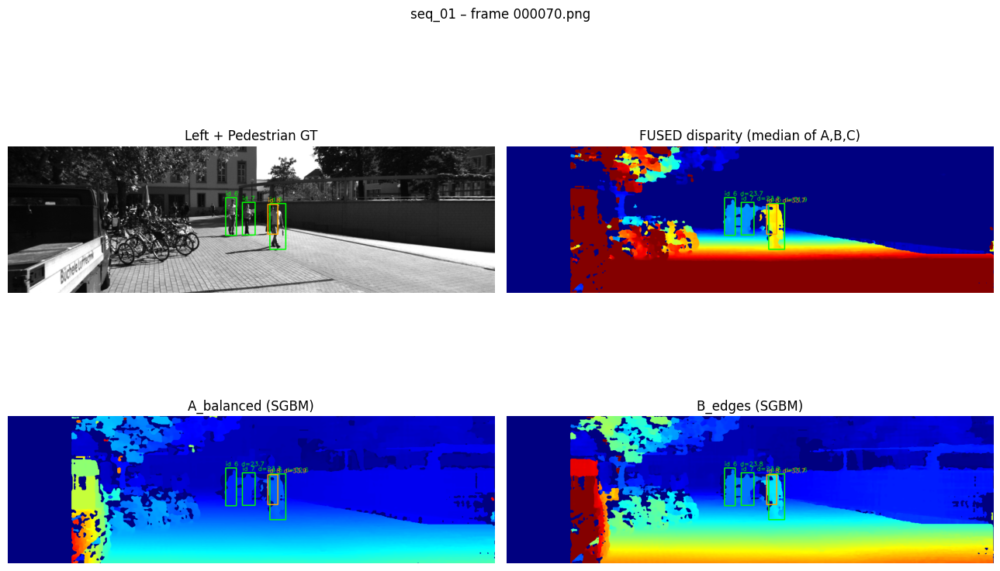


=== seq_01 - Frame 000080.png (frame_idx=80) ===


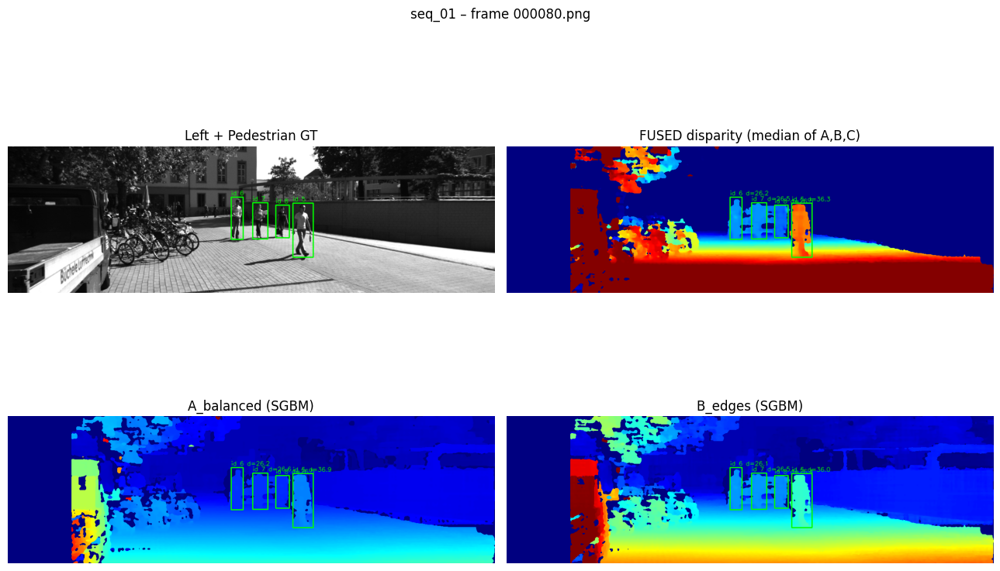


=== seq_01 - Frame 000090.png (frame_idx=90) ===


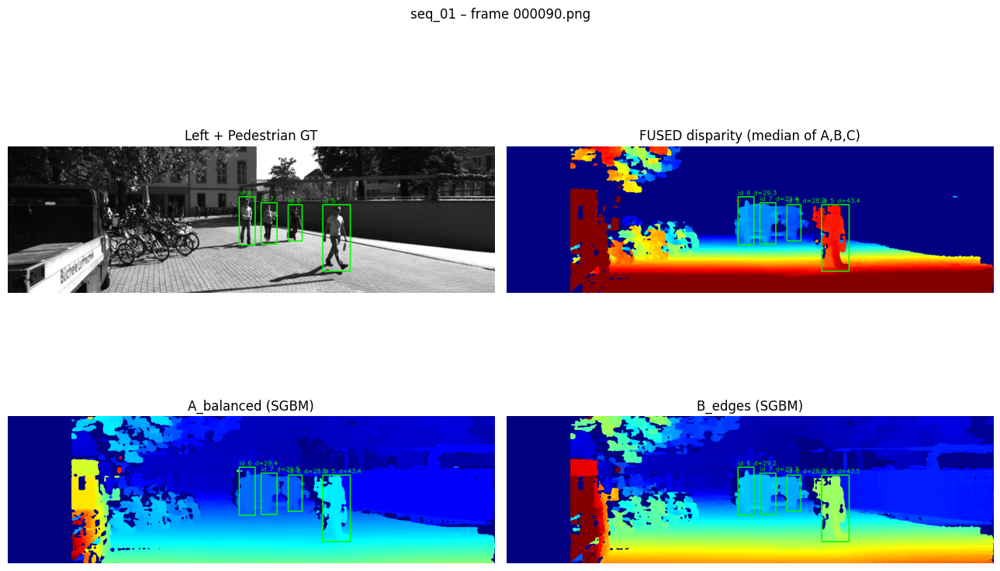


=== seq_01 - Frame 000100.png (frame_idx=100) ===


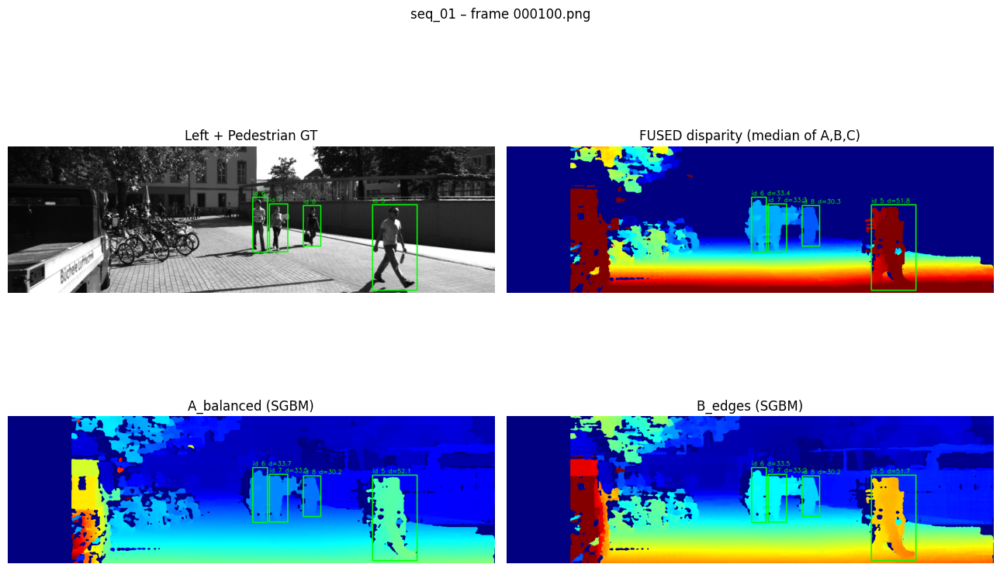


=== seq_01 - Frame 000110.png (frame_idx=110) ===


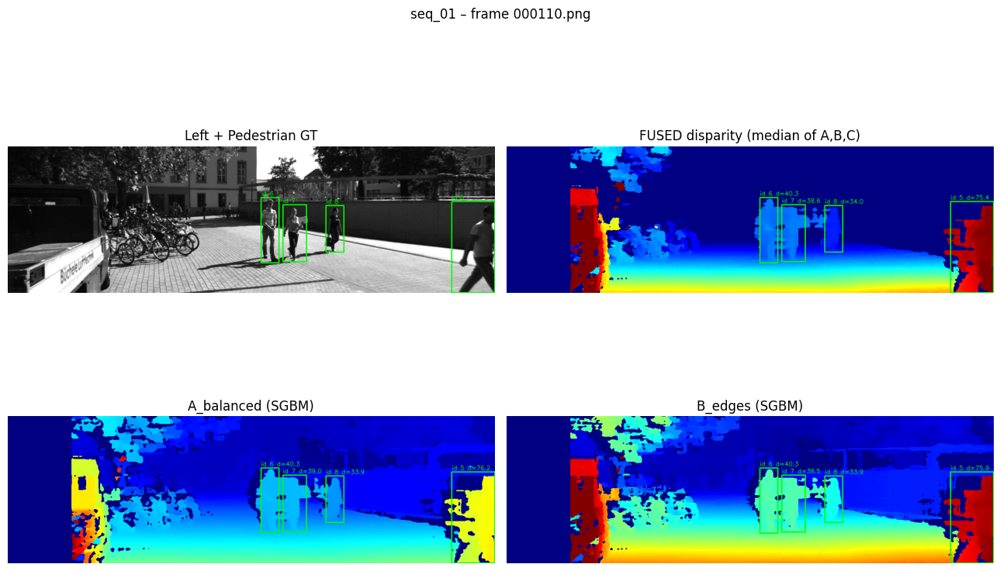


=== seq_01 - Frame 000120.png (frame_idx=120) ===


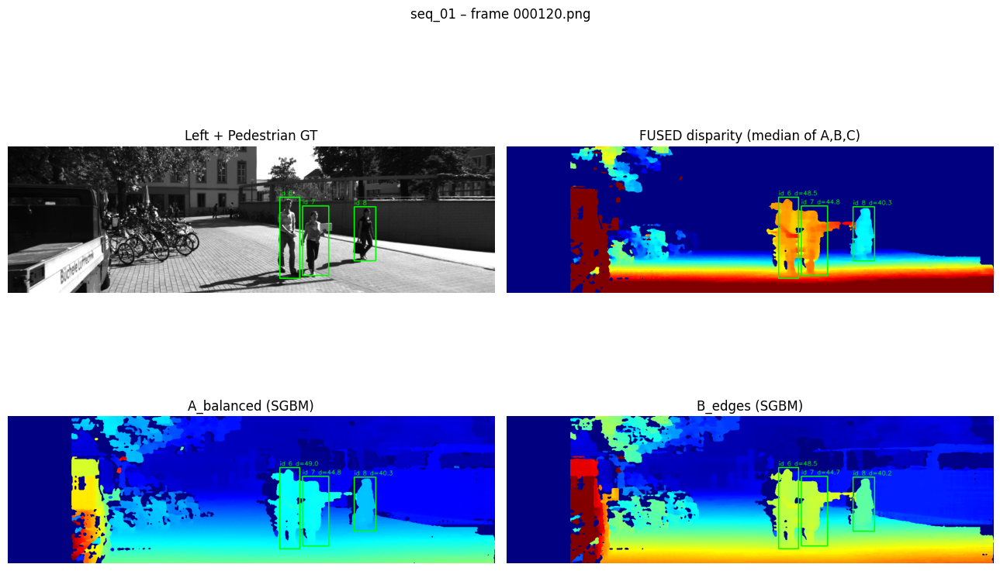


=== seq_01 - Frame 000130.png (frame_idx=130) ===


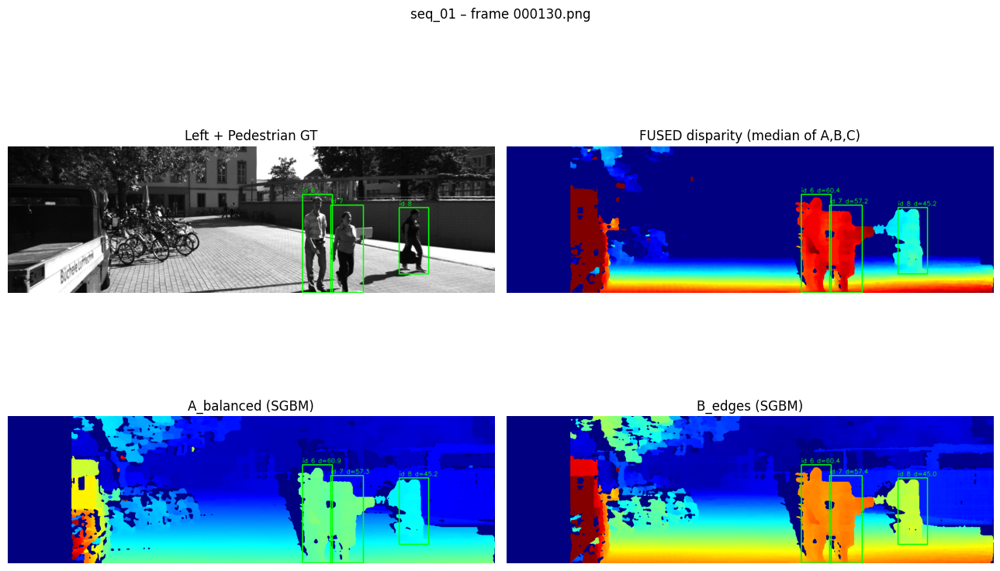


############################################################
Processing seq_02
############################################################

=== seq_02 - Frame 0000000000.png (frame_idx=0) ===


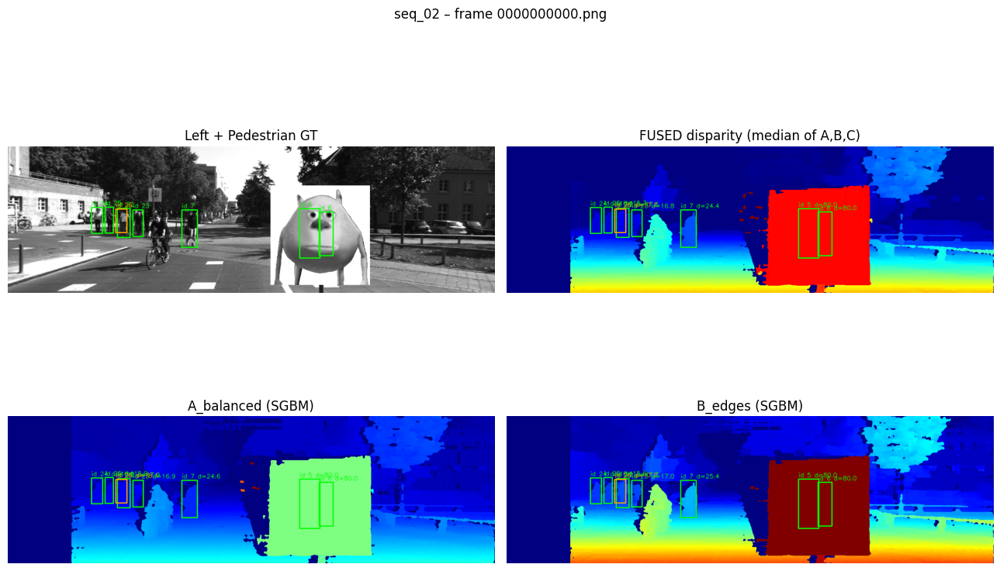


=== seq_02 - Frame 0000000010.png (frame_idx=10) ===


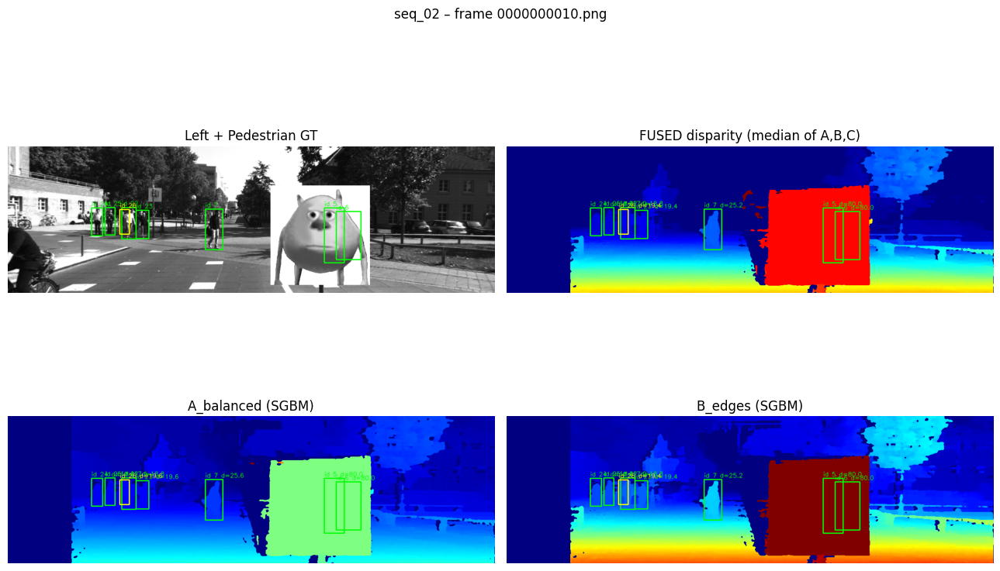


=== seq_02 - Frame 0000000020.png (frame_idx=20) ===


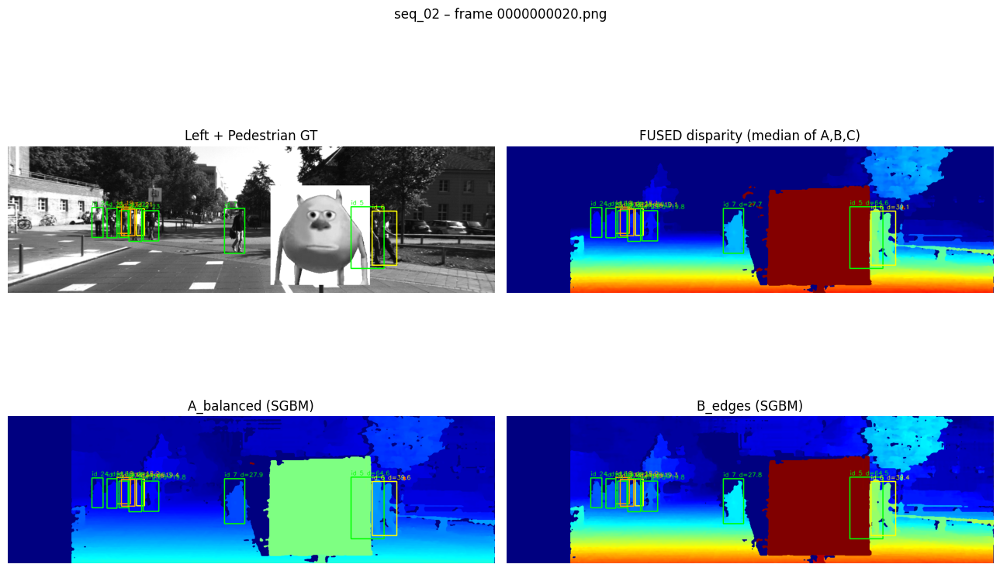


=== seq_02 - Frame 0000000030.png (frame_idx=30) ===


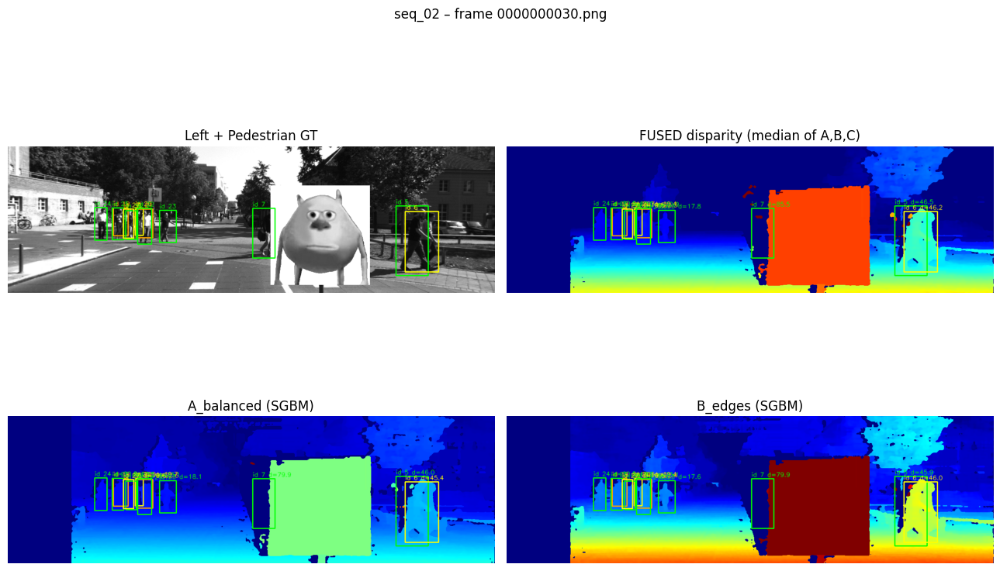


=== seq_02 - Frame 0000000040.png (frame_idx=40) ===


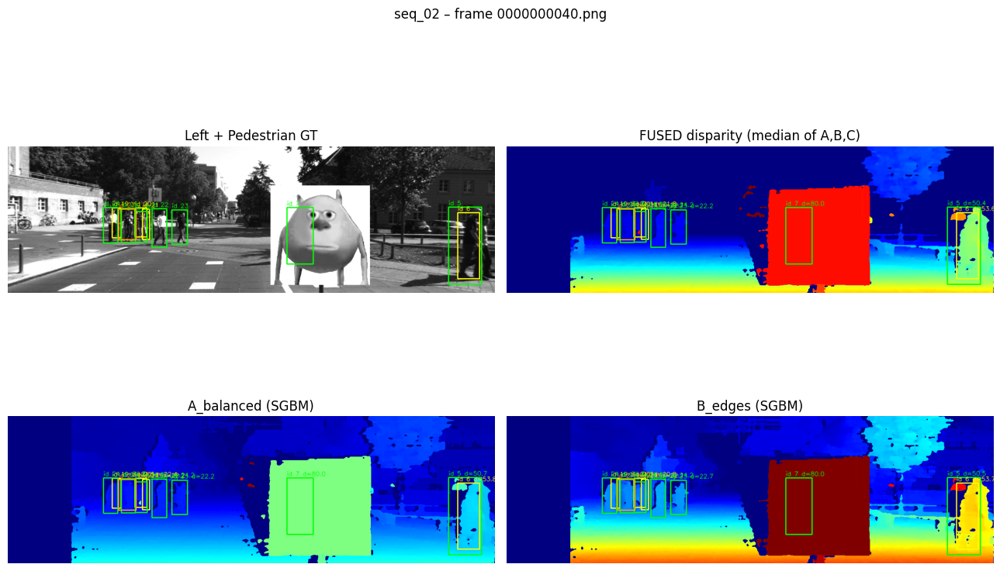


=== seq_02 - Frame 0000000050.png (frame_idx=50) ===


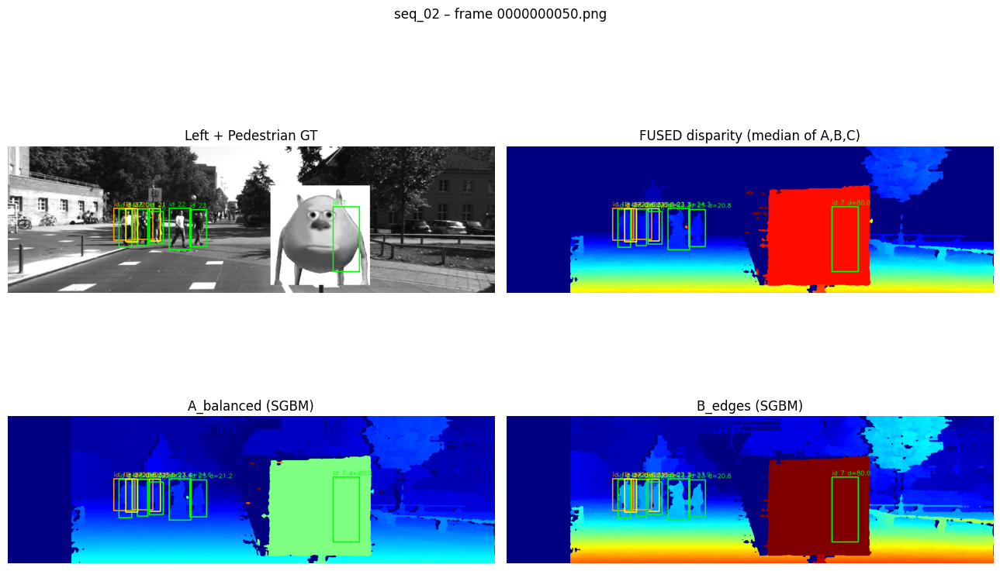


=== seq_02 - Frame 0000000060.png (frame_idx=60) ===


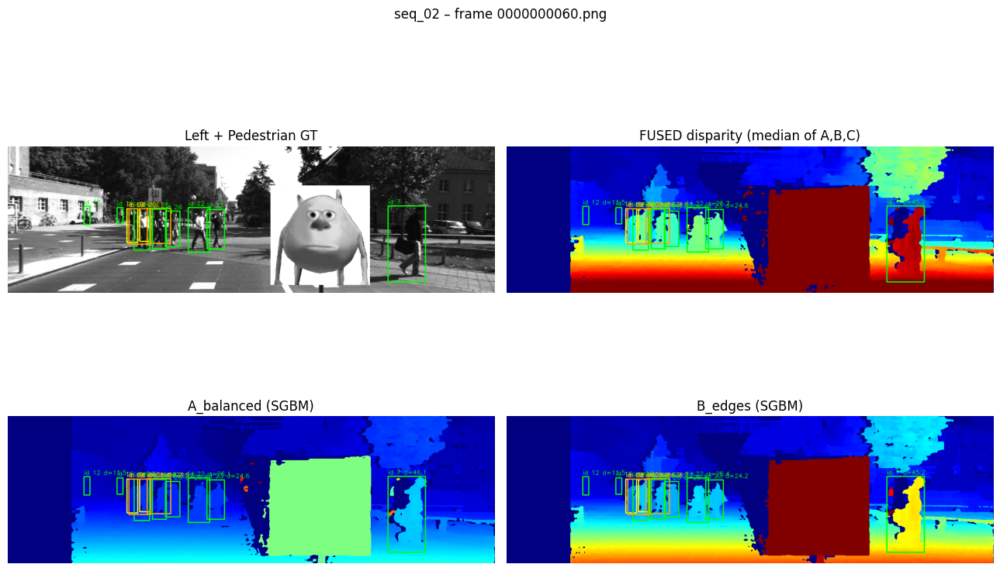


=== seq_02 - Frame 0000000070.png (frame_idx=70) ===


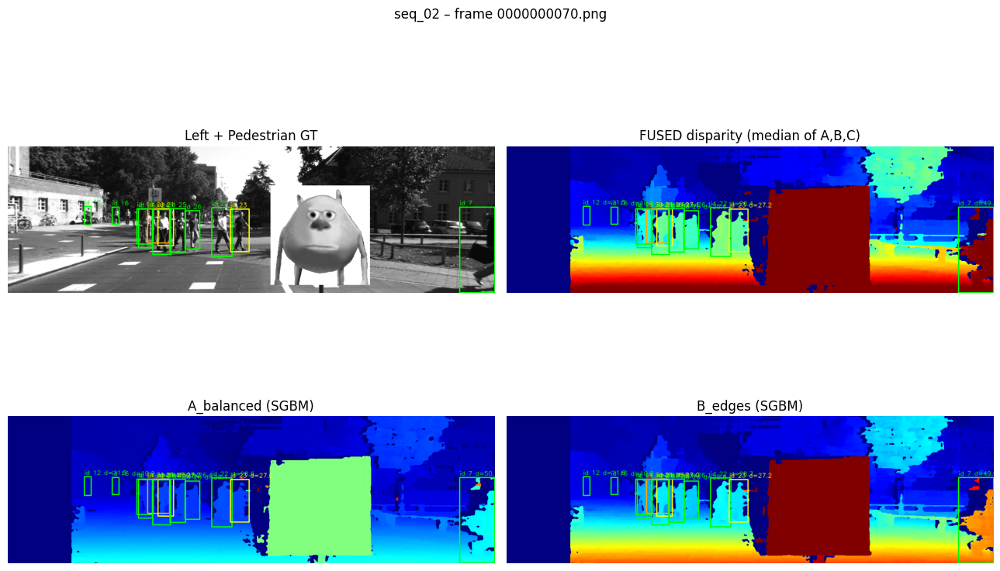


=== seq_02 - Frame 0000000080.png (frame_idx=80) ===


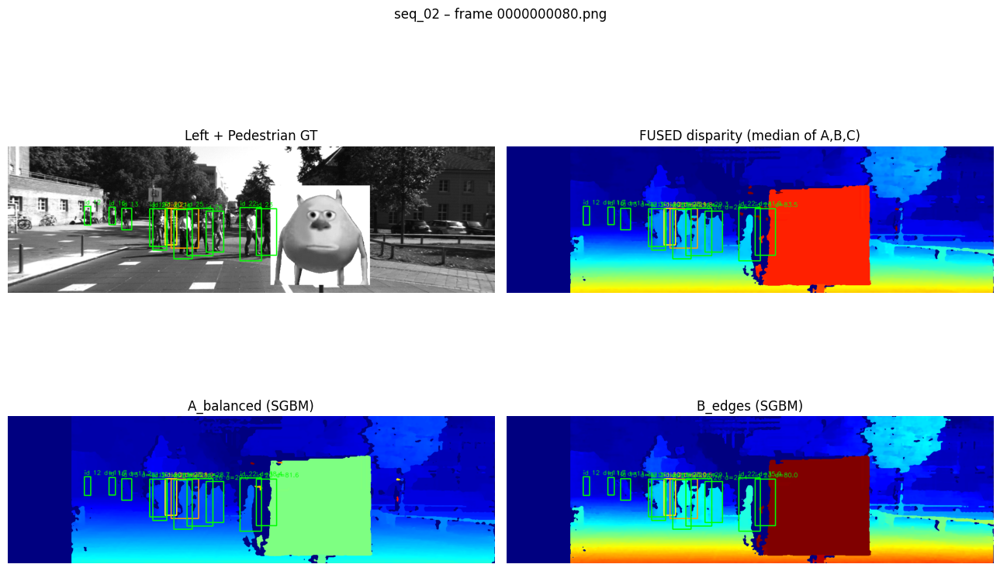


=== seq_02 - Frame 0000000090.png (frame_idx=90) ===


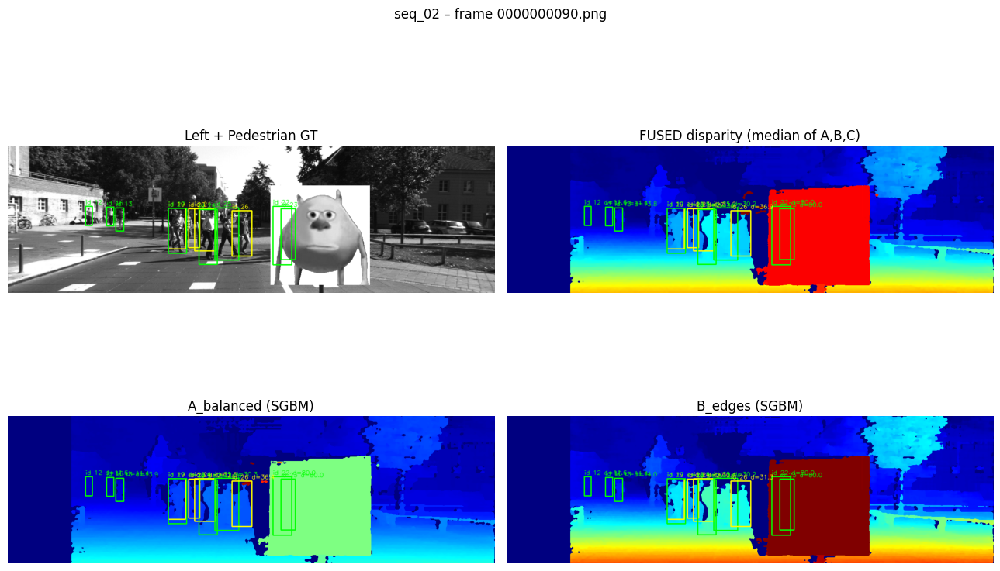


=== seq_02 - Frame 0000000100.png (frame_idx=100) ===


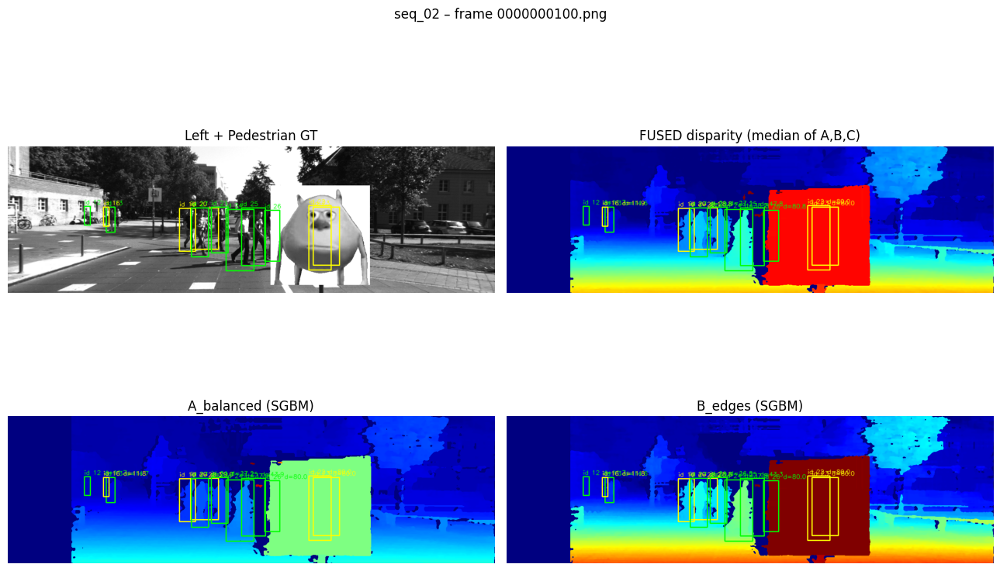


=== seq_02 - Frame 0000000110.png (frame_idx=110) ===


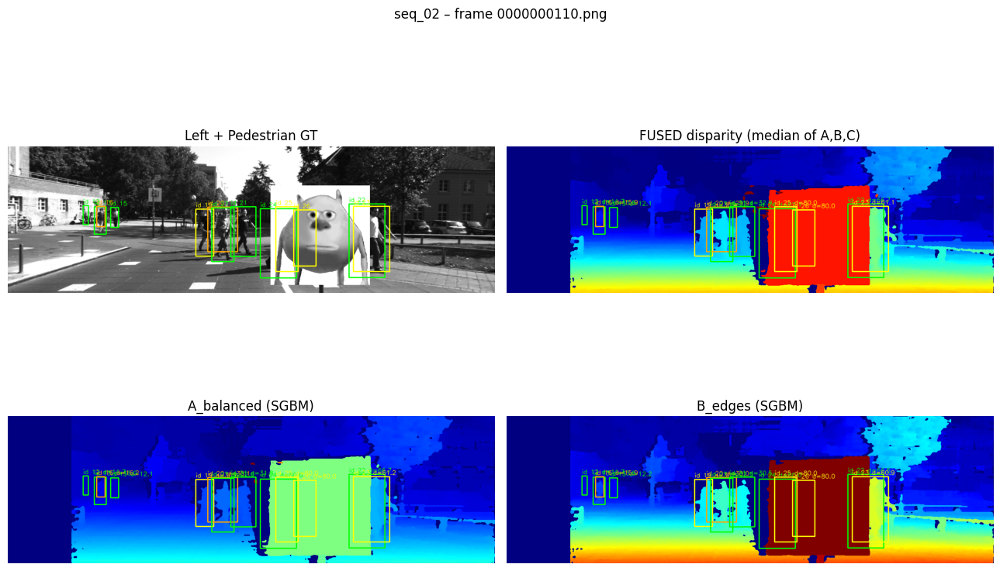


=== seq_02 - Frame 0000000120.png (frame_idx=120) ===


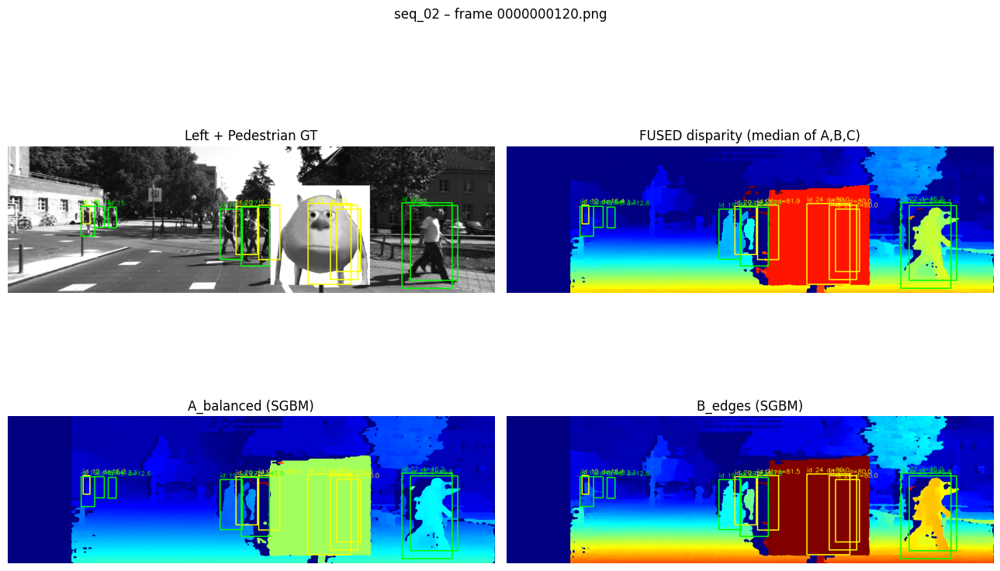


=== seq_02 - Frame 0000000130.png (frame_idx=130) ===


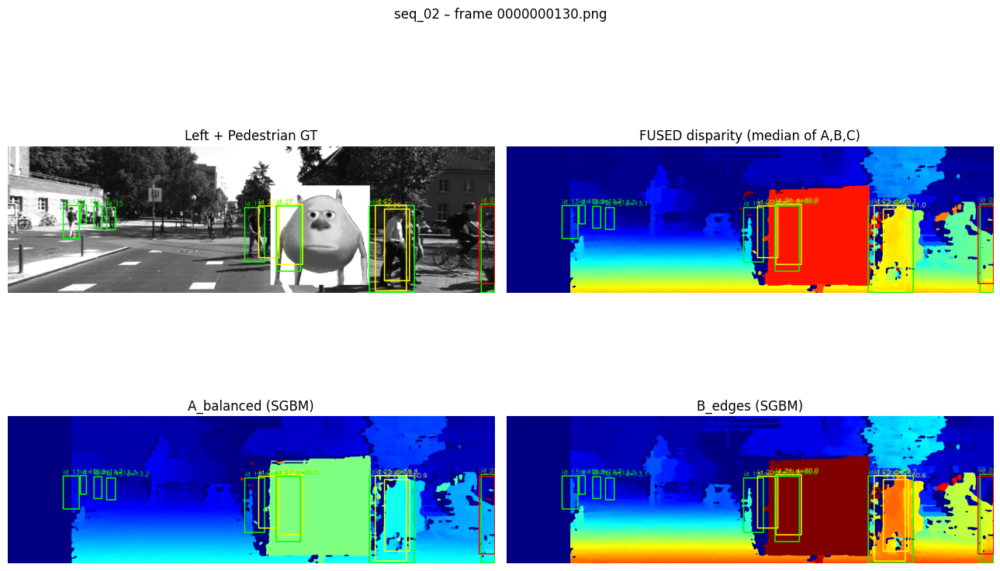


=== seq_02 - Frame 0000000140.png (frame_idx=140) ===


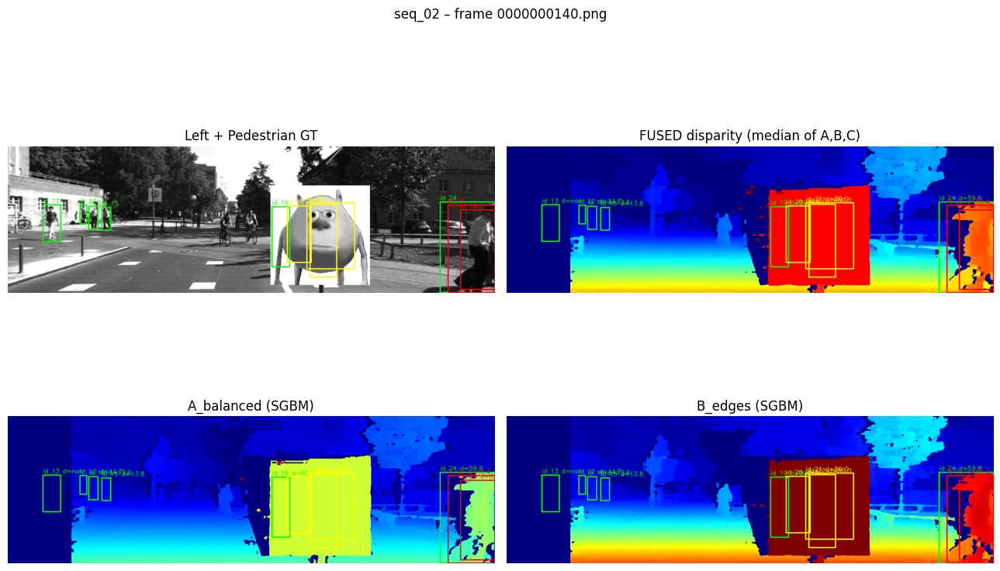


=== seq_02 - Frame 0000000150.png (frame_idx=150) ===


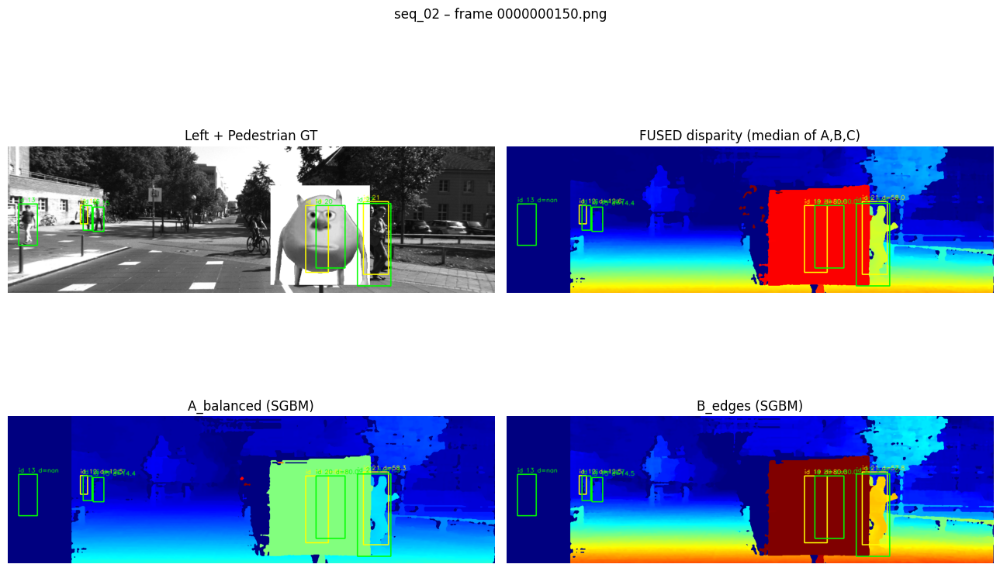


=== seq_02 - Frame 0000000160.png (frame_idx=160) ===


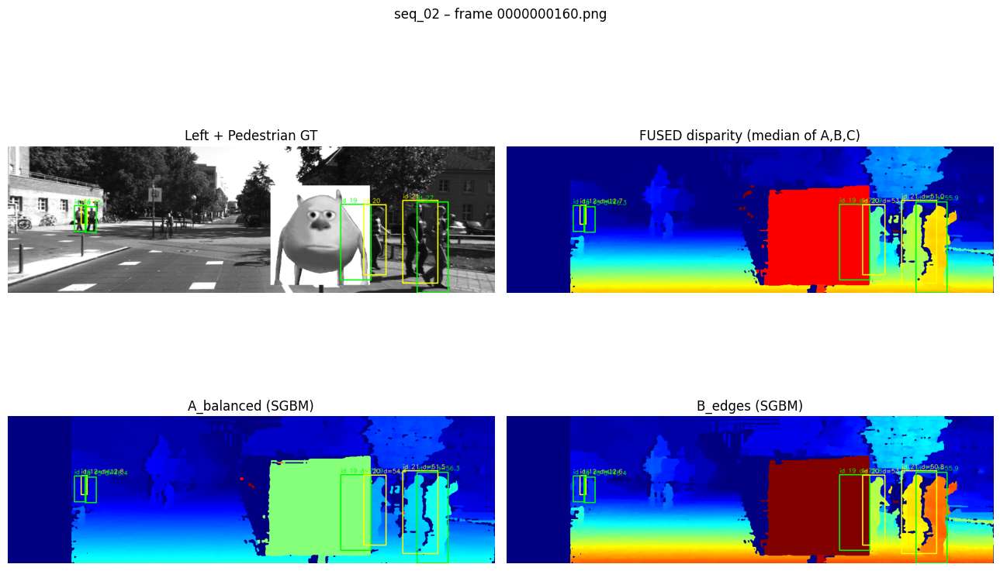


=== seq_02 - Frame 0000000170.png (frame_idx=170) ===


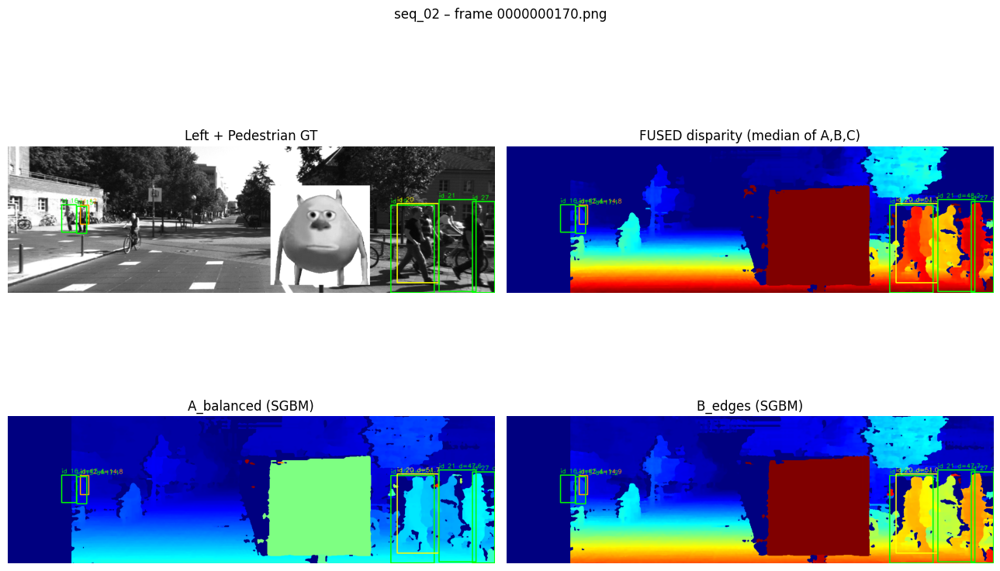

In [6]:
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

# =========================================================
# CONFIG: sequences and paths
# =========================================================

sequences = [
    {
        "name": "seq_01",
        "left_base":  Path(r"C:\Users\NILMA\Downloads\Project_perception\34759_final_project_rect\34759_final_project_rect\seq_01\image_02\data"),
        "right_base": Path(r"C:\Users\NILMA\Downloads\Project_perception\34759_final_project_rect\34759_final_project_rect\seq_01\image_03\data"),
        "start": 0,
        "end": 130,
        "step": 10,
        "fmt": "{:06d}.png",   # 000000.png, 000010.png, ...
    },
    {
        "name": "seq_02",
        "left_base":  Path(r"C:\Users\NILMA\Downloads\Project_perception\34759_final_project_rect\34759_final_project_rect\seq_02\image_02\data"),
        "right_base": Path(r"C:\Users\NILMA\Downloads\Project_perception\34759_final_project_rect\34759_final_project_rect\seq_02\image_03\data"),
        "start": 0,
        "end": 170,
        "step": 10,
        "fmt": "{:010d}.png",  # 0000000000.png, 0000000010.png, ...
    },
]

# --- Three SGBM configs ---
# A: balanced
# B: small blockSize, stronger smoothness (keep people contours)
# C: same as A but visualisation clips to near disparities (emphasise close objects)
sgbm_configs = [
    {
        "name": "A_balanced",
        "min_disp": 0,
        "num_disp": 160,
        "block_size": 5,
        "uniquenessRatio": 10,
        "speckleWindowSize": 50,
        "speckleRange": 1,
        "clip_mode": "none",      # no special clipping
    },
    {
        "name": "B_edges",
        "min_disp": 0,
        "num_disp": 160,
        "block_size": 3,          # smaller window → better on thin structures
        "uniquenessRatio": 5,
        "speckleWindowSize": 80,
        "speckleRange": 2,
        "clip_mode": "percentile",  # generic 2–98% clipping
    },
    {
        "name": "C_near_people",
        "min_disp": 0,
        "num_disp": 192,
        "block_size": 5,
        "uniquenessRatio": 10,
        "speckleWindowSize": 50,
        "speckleRange": 1,
        "clip_mode": "near",      # emphasise disparities similar to pedestrians
    },
]

# =========================================================
# Helper: load KITTI-style labels.txt
# =========================================================

def load_kitti_labels(label_path: Path):
    labels = []
    with label_path.open("r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            p = line.split()
            if len(p) < 17:
                continue
            obj = {
                "frame":      int(p[0]),
                "track_id":   int(p[1]),
                "type":       p[2],
                "truncation": float(p[3]),
                "occlusion":  int(p[4]),
                "alpha":      float(p[5]),
                "bbox_left":  float(p[6]),
                "bbox_top":   float(p[7]),
                "bbox_right": float(p[8]),
                "bbox_bottom":float(p[9]),
                "h":          float(p[10]),
                "w":          float(p[11]),
                "l":          float(p[12]),
                "X":          float(p[13]),
                "Y":          float(p[14]),
                "Z":          float(p[15]),
                "rotation_y": float(p[16]),
            }
            labels.append(obj)
    return labels


# =========================================================
# Helpers for evaluation & drawing
# =========================================================

def evaluate_pedestrian_disparities(disp, labels, frame_idx):
    """
    Compute mean disparity etc. for each Pedestrian in this frame.
    """
    disp = disp.astype(np.float32)
    H, W = disp.shape[:2]
    stats = []

    for o in labels:
        if o["frame"] != frame_idx:
            continue
        if o["type"] != "Pedestrian":
            continue

        x1 = int(round(o["bbox_left"]))
        y1 = int(round(o["bbox_top"]))
        x2 = int(round(o["bbox_right"]))
        y2 = int(round(o["bbox_bottom"]))

        x1 = np.clip(x1, 0, W-1)
        x2 = np.clip(x2, 0, W)
        y1 = np.clip(y1, 0, H-1)
        y2 = np.clip(y2, 0, H)

        if x2 <= x1 or y2 <= y1:
            continue

        patch = disp[y1:y2, x1:x2]
        if patch.size == 0:
            continue

        valid = patch > 0
        if valid.sum() == 0:
            mean_disp = np.nan
        else:
            mean_disp = float(patch[valid].mean())
        frac_invalid = float((~valid).sum()) / float(patch.size)

        stats.append({
            "track_id":     o["track_id"],
            "occlusion":    o["occlusion"],
            "bbox":         (x1, y1, x2, y2),
            "mean_disp":    mean_disp,
            "frac_invalid": frac_invalid,
            "Z_gt":         o["Z"],
        })
    return stats


def draw_pedestrians_on_left(imgL, labels, frame_idx):
    img_vis = cv2.cvtColor(imgL, cv2.COLOR_GRAY2BGR)
    for o in labels:
        if o["frame"] != frame_idx or o["type"] != "Pedestrian":
            continue
        x1 = int(round(o["bbox_left"]))
        y1 = int(round(o["bbox_top"]))
        x2 = int(round(o["bbox_right"]))
        y2 = int(round(o["bbox_bottom"]))
        occ = o["occlusion"]
        color = [(0,255,0), (0,255,255), (0,165,255), (0,0,255)][min(occ,3)]
        cv2.rectangle(img_vis, (x1,y1), (x2,y2), color, 2)
        cv2.putText(
            img_vis,
            f"id {o['track_id']}",
            (x1, max(0, y1-5)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            color,
            1,
            lineType=cv2.LINE_AA
        )
    return img_vis


def overlay_ped_stats_on_disp_color(disp_color, stats):
    img = disp_color.copy()
    for s in stats:
        x1, y1, x2, y2 = s["bbox"]
        occ = s["occlusion"]
        color = [(0,255,0), (0,255,255), (0,165,255), (0,0,255)][min(occ,3)]
        cv2.rectangle(img, (x1,y1), (x2,y2), color, 2)
        txt = f"id {s['track_id']} d={s['mean_disp']:.1f}"
        cv2.putText(
            img,
            txt,
            (x1, max(0, y1-5)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            color,
            1,
            lineType=cv2.LINE_AA
        )
    return img


def build_sgbm(cfg):
    w = cfg["block_size"]
    return cv2.StereoSGBM_create(
        minDisparity=cfg["min_disp"],
        numDisparities=cfg["num_disp"],
        blockSize=w,
        P1=8 * 3 * w * w,
        P2=32 * 3 * w * w,
        disp12MaxDiff=1,
        uniquenessRatio=cfg["uniquenessRatio"],
        speckleWindowSize=cfg["speckleWindowSize"],
        speckleRange=cfg["speckleRange"],
        preFilterCap=63,
        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY,
    )


def disparity_to_colormap(disp, cfg, ped_stats=None):
    """
    Convert raw float disparity to a color map.
    If cfg["clip_mode"] == "near" and ped_stats is given, we clip around
    pedestrian disparities so they pop more.
    """
    disp_work = disp.copy()

    # Ignore invalid / negative
    disp_work[disp_work <= cfg.get("min_disp", 0)] = np.nan
    valid = disp_work[~np.isnan(disp_work)]
    if valid.size == 0:
        disp_work[:] = 0
    else:
        clip_mode = cfg.get("clip_mode", "none")
        if clip_mode == "percentile":
            lo, hi = np.percentile(valid, [2, 98])
        elif clip_mode == "near" and ped_stats:
            # Focus range around pedestrians' mean disparities
            ped_means = np.array([s["mean_disp"] for s in ped_stats if not np.isnan(s["mean_disp"])])
            if ped_means.size > 0:
                d_min = ped_means.min() - 5
                d_max = ped_means.max() + 10
                lo, hi = max(d_min, valid.min()), min(d_max, valid.max())
            else:
                lo, hi = np.percentile(valid, [2, 98])
        else:
            lo, hi = valid.min(), valid.max()

        disp_work = np.clip(disp_work, lo, hi)
        disp_work = np.nan_to_num(disp_work, nan=lo)

    disp_norm = cv2.normalize(disp_work, None, 0, 255, cv2.NORM_MINMAX)
    disp_norm = np.uint8(disp_norm)
    disp_color = cv2.applyColorMap(disp_norm, cv2.COLORMAP_JET)
    return disp_color


# =========================================================
# MAIN LOOP: sequences / frames / 3 configs + fused
# =========================================================

for seq in sequences:
    print("\n" + "#" * 60)
    print(f"Processing {seq['name']}")
    print("#" * 60)

    left_base  = seq["left_base"]
    right_base = seq["right_base"]
    fmt        = seq["fmt"]

    # left_base = ...\seq_xx\image_02\data  → parent[1] = ...\seq_xx
    seq_dir    = left_base.parents[1]
    labels_path = seq_dir / "labels.txt"
    if not labels_path.is_file():
        print(f"  WARNING: no labels.txt found for {seq['name']} at {labels_path}")
        continue

    labels = load_kitti_labels(labels_path)

    for frame_idx in range(seq["start"], seq["end"] + 1, seq["step"]):
        fname = fmt.format(frame_idx)

        left_img_path  = left_base  / fname
        right_img_path = right_base / fname

        imgL = cv2.imread(str(left_img_path),  cv2.IMREAD_GRAYSCALE)
        imgR = cv2.imread(str(right_img_path), cv2.IMREAD_GRAYSCALE)

        if imgL is None or imgR is None:
            print(f"  Skipping {seq['name']} - {fname}: could not load one of the images.")
            continue

        print(f"\n=== {seq['name']} - Frame {fname} (frame_idx={frame_idx}) ===")

        # Left image with pedestrians
        left_with_peds = draw_pedestrians_on_left(imgL, labels, frame_idx)
        left_rgb = cv2.cvtColor(left_with_peds, cv2.COLOR_BGR2RGB)

        # --- compute raw disparities for all 3 configs ---
        raw_disps = []
        ped_stats_cfg = []
        for cfg in sgbm_configs:
            sgbm = build_sgbm(cfg)
            raw_disp = sgbm.compute(imgL, imgR).astype(np.float32) / 16.0
            raw_disp = cv2.medianBlur(raw_disp, 5)
            raw_disps.append(raw_disp)

            stats = evaluate_pedestrian_disparities(raw_disp, labels, frame_idx)
            ped_stats_cfg.append(stats)

        # --- fuse disparities (pixel-wise median, ignoring invalid) ---
        disp_stack = np.stack(raw_disps, axis=0)        # (3, H, W)
        disp_stack_masked = np.where(disp_stack > 0, disp_stack, np.nan)
        disp_fused = np.nanmedian(disp_stack_masked, axis=0)
        disp_fused = np.nan_to_num(disp_fused, nan=0.0)

        ped_stats_fused = evaluate_pedestrian_disparities(disp_fused, labels, frame_idx)
        fused_cfg = {"min_disp": 0, "clip_mode": "near"}  # clip around pedestrians

        disp_color_fused = disparity_to_colormap(disp_fused, fused_cfg, ped_stats_fused)
        disp_fused_with_boxes = overlay_ped_stats_on_disp_color(disp_color_fused, ped_stats_fused)
        disp_fused_rgb = cv2.cvtColor(disp_fused_with_boxes, cv2.COLOR_BGR2RGB)

        # Prepare figure
        fig, axes = plt.subplots(2, 2, figsize=(13, 9))
        fig.suptitle(f"{seq['name']} – frame {fname}")

        # Top-left: left image with GT
        axes[0,0].imshow(left_rgb)
        axes[0,0].set_title("Left + Pedestrian GT")
        axes[0,0].axis("off")

        # Top-right: fused disparity
        axes[0,1].imshow(disp_fused_rgb)
        axes[0,1].set_title("FUSED disparity (median of A,B,C)")
        axes[0,1].axis("off")

        # Bottom-left: config A
        cfgA = sgbm_configs[0]
        rawA = raw_disps[0]
        statsA = ped_stats_cfg[0]
        dispA_color = disparity_to_colormap(rawA, cfgA, statsA)
        dispA_with_boxes = overlay_ped_stats_on_disp_color(dispA_color, statsA)
        dispA_rgb = cv2.cvtColor(dispA_with_boxes, cv2.COLOR_BGR2RGB)

        axes[1,0].imshow(dispA_rgb)
        axes[1,0].set_title("A_balanced (SGBM)")
        axes[1,0].axis("off")

        # Bottom-right: config B
        cfgB = sgbm_configs[1]
        rawB = raw_disps[1]
        statsB = ped_stats_cfg[1]
        dispB_color = disparity_to_colormap(rawB, cfgB, statsB)
        dispB_with_boxes = overlay_ped_stats_on_disp_color(dispB_color, statsB)
        dispB_rgb = cv2.cvtColor(dispB_with_boxes, cv2.COLOR_BGR2RGB)

        axes[1,1].imshow(dispB_rgb)
        axes[1,1].set_title("B_edges (SGBM)")
        axes[1,1].axis("off")

        plt.tight_layout()
        plt.show()   # one window per frame; close to continue


In [10]:
import cv2
import numpy as np
from pathlib import Path

# =========================================================
# Stereo camera parameters (change to your calibration)
# =========================================================
FOCAL_PX   = 721.0   # focal length in pixels
BASELINE_M = 0.54    # baseline in meters

# Area fractions for central crops
# 100%, 50%, 30%, 10% of bbox area (same aspect ratio)
AREA_FRACTIONS = [1.0, 0.5, 0.3, 0.1]


# =========================================================
# CONFIG: sequences and paths
# =========================================================

sequences = [
    {
        "name": "seq_01",
        "left_base":  Path(r"C:\Users\NILMA\Downloads\Project_perception\34759_final_project_rect\34759_final_project_rect\seq_01\image_02\data"),
        "right_base": Path(r"C:\Users\NILMA\Downloads\Project_perception\34759_final_project_rect\34759_final_project_rect\seq_01\image_03\data"),
        "start": 0,
        "end": 130,
        "step": 10,
        "fmt": "{:06d}.png",   # 000000.png, 000010.png, ...
    },
    {
        "name": "seq_02",
        "left_base":  Path(r"C:\Users\NILMA\Downloads\Project_perception\34759_final_project_rect\34759_final_project_rect\seq_02\image_02\data"),
        "right_base": Path(r"C:\Users\NILMA\Downloads\Project_perception\34759_final_project_rect\34759_final_project_rect\seq_02\image_03\data"),
        "start": 0,
        "end": 170,
        "step": 10,
        "fmt": "{:010d}.png",  # 0000000000.png, 0000000010.png, ...
    },
]

# --- SGBM configs ---
sgbm_configs = [
    {
        "name": "A_balanced",
        "min_disp": 0,
        "num_disp": 128,
        "block_size": 5,
        "uniquenessRatio": 10,
        "speckleWindowSize": 50,
        "speckleRange": 1,
        "smooth_scale": 1.0,
    },
    {
        "name": "B_edges",
        "min_disp": 0,
        "num_disp": 128,
        "block_size": 3,          # smaller window → better on thin structures
        "uniquenessRatio": 5,
        "speckleWindowSize": 80,
        "speckleRange": 2,
        "smooth_scale": 1.0,
    },
    {
        "name": "C_near_people",
        "min_disp": 0,
        "num_disp": 128,
        "block_size": 5,
        "uniquenessRatio": 10,
        "speckleWindowSize": 50,
        "speckleRange": 1,
        "smooth_scale": 1.0,
    },
    {
        "name": "D_far",
        "min_disp": 0,
        "num_disp": 128,
        "block_size": 7,          # larger window → more robust for small disparities
        "uniquenessRatio": 3,     # more tolerant
        "speckleWindowSize": 100,
        "speckleRange": 2,
        "smooth_scale": 0.5,      # reduce smoothness (P1/P2) → less bias to 0
    },
]


# =========================================================
# Helper: load KITTI-style labels.txt
# =========================================================

def load_kitti_labels(label_path: Path):
    labels = []
    with label_path.open("r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            p = line.split()
            if len(p) < 17:
                continue
            obj = {
                "frame":      int(p[0]),
                "track_id":   int(p[1]),
                "type":       p[2],
                "truncation": float(p[3]),
                "occlusion":  int(p[4]),
                "alpha":      float(p[5]),
                "bbox_left":  float(p[6]),
                "bbox_top":   float(p[7]),
                "bbox_right": float(p[8]),
                "bbox_bottom":float(p[9]),
                "h":          float(p[10]),
                "w":          float(p[11]),
                "l":          float(p[12]),
                "X":          float(p[13]),
                "Y":          float(p[14]),
                "Z":          float(p[15]),
                "rotation_y": float(p[16]),
            }
            labels.append(obj)
    return labels


# =========================================================
# Helpers: disparity evaluation
# =========================================================

def evaluate_pedestrian_disparities(disp, labels, frame_idx, area_fraction: float):
    """
    Compute disparity & depth stats for each Pedestrian in this frame,
    using the central crop whose area is 'area_fraction' of the full bbox area
    (same aspect ratio).

    Returns a list of dicts with:
      - track_id
      - bbox_full
      - bbox_central
      - mean_disp, median_disp
      - Z_est, Z_gt
      - abs_err, rel_err
      - frac_invalid
      - area_fraction
    """
    disp = disp.astype(np.float32)
    H, W = disp.shape[:2]
    stats = []

    scale = np.sqrt(area_fraction)  # keep aspect ratio, shrink area

    for o in labels:
        if o["frame"] != frame_idx:
            continue
        if o["type"] != "Pedestrian":
            continue

        # Original bbox
        x1 = o["bbox_left"]
        y1 = o["bbox_top"]
        x2 = o["bbox_right"]
        y2 = o["bbox_bottom"]

        w_box = x2 - x1
        h_box = y2 - y1
        if w_box <= 1 or h_box <= 1:
            continue

        # Center of original bbox
        cx = 0.5 * (x1 + x2)
        cy = 0.5 * (y1 + y2)

        # Scaled half-width / half-height
        half_w = 0.5 * w_box * scale
        half_h = 0.5 * h_box * scale

        # Cropped bbox (central)
        x1_c = int(round(cx - half_w))
        x2_c = int(round(cx + half_w))
        y1_c = int(round(cy - half_h))
        y2_c = int(round(cy + half_h))

        # Clip to image bounds
        x1_c = np.clip(x1_c, 0, W-1)
        x2_c = np.clip(x2_c, 0, W)
        y1_c = np.clip(y1_c, 0, H-1)
        y2_c = np.clip(y2_c, 0, H)

        if x2_c <= x1_c or y2_c <= y1_c:
            continue

        patch = disp[y1_c:y2_c, x1_c:x2_c]
        if patch.size == 0:
            continue

        valid = patch > 0
        if valid.sum() == 0:
            mean_disp   = np.nan
            median_disp = np.nan
        else:
            vals = patch[valid]
            mean_disp   = float(vals.mean())
            median_disp = float(np.median(vals))

        # Depth from mean disparity (you could also swap to median_disp)
        if mean_disp is None or np.isnan(mean_disp) or mean_disp <= 0:
            Z_est = np.nan
        else:
            Z_est = (FOCAL_PX * BASELINE_M) / mean_disp  # meters

        Z_gt = o["Z"]  # GT depth from labels (usually meters)

        if np.isnan(Z_est):
            abs_err = np.nan
            rel_err = np.nan
        else:
            abs_err = float(Z_est - Z_gt)
            rel_err = float(abs_err / Z_gt) if Z_gt != 0 else np.nan

        stats.append({
            "track_id":     o["track_id"],
            "occlusion":    o["occlusion"],
            "bbox_full":    (int(round(x1)), int(round(y1)), int(round(x2)), int(round(y2))),
            "bbox_central": (x1_c, y1_c, x2_c, y2_c),
            "mean_disp":    mean_disp,
            "median_disp":  median_disp,
            "frac_invalid": float((~valid).sum()) / float(patch.size),
            "Z_gt":         Z_gt,
            "Z_est":        Z_est,
            "abs_err":      abs_err,         # Z_est - Z_gt  (meters)
            "rel_err":      rel_err,         # (Z_est - Z_gt)/Z_gt
            "area_fraction": area_fraction,  # for reference
        })
    return stats


def build_sgbm(cfg):
    w = cfg["block_size"]
    smooth_scale = cfg.get("smooth_scale", 1.0)
    P1 = int(8 * 3 * w * w * smooth_scale)
    P2 = int(32 * 3 * w * w * smooth_scale)

    return cv2.StereoSGBM_create(
        minDisparity=cfg["min_disp"],
        numDisparities=cfg["num_disp"],
        blockSize=w,
        P1=P1,
        P2=P2,
        disp12MaxDiff=1,
        uniquenessRatio=cfg["uniquenessRatio"],
        speckleWindowSize=cfg["speckleWindowSize"],
        speckleRange=cfg["speckleRange"],
        preFilterCap=63,
        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY,
    )


# =========================================================
# MAIN LOOP: sequences / frames / disparity + depth comparison
# =========================================================

for seq in sequences:
    print("\n" + "#" * 60)
    print(f"Processing {seq['name']}")
    print("#" * 60)

    left_base  = seq["left_base"]
    right_base = seq["right_base"]
    fmt        = seq["fmt"]

    seq_dir    = left_base.parents[1]       # ...\seq_xx
    labels_path = seq_dir / "labels.txt"
    if not labels_path.is_file():
        print(f"  WARNING: no labels.txt found for {seq['name']} at {labels_path}")
        continue

    labels = load_kitti_labels(labels_path)

    for frame_idx in range(seq["start"], seq["end"] + 1, seq["step"]):
        fname = fmt.format(frame_idx)

        left_img_path  = left_base  / fname
        right_img_path = right_base / fname

        imgL = cv2.imread(str(left_img_path),  cv2.IMREAD_GRAYSCALE)
        imgR = cv2.imread(str(right_img_path), cv2.IMREAD_GRAYSCALE)

        if imgL is None or imgR is None:
            print(f"  Skipping {seq['name']} - {fname}: could not load one of the images.")
            continue

        print(f"\n=== {seq['name']} - Frame {fname} (frame_idx={frame_idx}) ===")

        # Contrast enhancement (helps far objects / low-texture areas)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        imgL_eq = clahe.apply(imgL)
        imgR_eq = clahe.apply(imgR)

        # --- compute raw disparities for all configs ---
        raw_disps = []
        for cfg in sgbm_configs:
            sgbm = build_sgbm(cfg)
            raw_disp = sgbm.compute(imgL_eq, imgR_eq).astype(np.float32) / 16.0

            # Stronger blur for A/B/C, lighter for D_far to keep small disparities
            if cfg["name"] == "D_far":
                raw_disp = cv2.medianBlur(raw_disp, 3)
            else:
                raw_disp = cv2.medianBlur(raw_disp, 5)

            raw_disps.append(raw_disp)

        # --- fuse disparities (pixel-wise median, ignoring invalid) ---
        disp_stack = np.stack(raw_disps, axis=0)        # (N_cfg, H, W)
        disp_stack_masked = np.where(disp_stack > 0, disp_stack, np.nan)
        disp_fused = np.nanmedian(disp_stack_masked, axis=0)
        disp_fused = np.nan_to_num(disp_fused, nan=0.0)

        # Mild blur on fused map (don’t oversmooth far structure)
        disp_fused = cv2.medianBlur(disp_fused.astype(np.float32), 3)

        # ---- Depth comparisons for different bbox area fractions ----
        stats_by_fraction = {}
        for af in AREA_FRACTIONS:
            stats = evaluate_pedestrian_disparities(disp_fused, labels, frame_idx, af)
            stats_by_fraction[af] = {s["track_id"]: s for s in stats}

        all_ids = set()
        for d in stats_by_fraction.values():
            all_ids |= set(d.keys())
        all_ids = sorted(all_ids)

        print("  Pedestrian depth estimates from FUSED disparity")
        print("  (central crops with bbox area fractions: 1.0, 0.5, 0.3, 0.1)\n")

        if not all_ids:
            print("    (no pedestrians in this frame or no valid disparity)")
            continue

        for tid in all_ids:
            print(f"    track_id = {tid}")
            for af in AREA_FRACTIONS:
                s = stats_by_fraction[af].get(tid, None)
                if s is None:
                    print(f"      area={af:4.2f}: no valid crop / no disparity")
                    continue

                if np.isnan(s["Z_est"]) or np.isnan(s["rel_err"]):
                    print(
                        f"      area={af:4.2f}: "
                        f"mean_disp={s['mean_disp']:.2f} px | "
                        f"Z_est=nan | Z_gt={s['Z_gt']:.2f} m | "
                        f"frac_invalid={s['frac_invalid']:.2f}"
                    )
                else:
                    print(
                        f"      area={af:4.2f}: "
                        f"mean_disp={s['mean_disp']:.2f} px | "
                        f"Z_est={s['Z_est']:.2f} m | "
                        f"Z_gt={s['Z_gt']:.2f} m | "
                        f"abs_err={s['abs_err']:.2f} m | "
                        f"rel_err={s['rel_err']*100:.1f}% | "
                        f"frac_invalid={s['frac_invalid']:.2f}"
                    )
            print()  # blank line between track_ids



############################################################
Processing seq_01
############################################################

=== seq_01 - Frame 000000.png (frame_idx=0) ===


C:\Users\NILMA\AppData\Local\Temp\ipykernel_39352\1831121362.py:313: RuntimeWarning: All-NaN slice encountered
  disp_fused = np.nanmedian(disp_stack_masked, axis=0)


  Pedestrian depth estimates from FUSED disparity
  (central crops with bbox area fractions: 1.0, 0.5, 0.3, 0.1)

    track_id = 0
      area=1.00: mean_disp=39.68 px | Z_est=9.81 m | Z_gt=6.82 m | abs_err=3.00 m | rel_err=44.0% | frac_invalid=0.09
      area=0.50: mean_disp=43.02 px | Z_est=9.05 m | Z_gt=6.82 m | abs_err=2.23 m | rel_err=32.8% | frac_invalid=0.07
      area=0.30: mean_disp=47.34 px | Z_est=8.22 m | Z_gt=6.82 m | abs_err=1.41 m | rel_err=20.6% | frac_invalid=0.04
      area=0.10: mean_disp=55.19 px | Z_est=7.05 m | Z_gt=6.82 m | abs_err=0.24 m | rel_err=3.5% | frac_invalid=0.00

    track_id = 1
      area=1.00: mean_disp=52.06 px | Z_est=7.48 m | Z_gt=5.92 m | abs_err=1.55 m | rel_err=26.2% | frac_invalid=0.17
      area=0.50: mean_disp=58.19 px | Z_est=6.69 m | Z_gt=5.92 m | abs_err=0.77 m | rel_err=12.9% | frac_invalid=0.10
      area=0.30: mean_disp=59.59 px | Z_est=6.53 m | Z_gt=5.92 m | abs_err=0.61 m | rel_err=10.3% | frac_invalid=0.02
      area=0.10: mean_disp